In [390]:
import numpy as np
from moire.lattice import Lattice
from moire.dft import DFT
import numpy as np
from collections import defaultdict
from itertools import product
import os
from scipy.interpolate import griddata, RectBivariateSpline
import plotly.graph_objs as go
from scipy.ndimage import fourier_gaussian
from moire.lattice import Lattice, Bilayer, Supercell
from moire.dft.decorators import save, change_directory
import moire.dft.io_processing as io
import scipy
from scipy import ndimage

In [419]:
def C3(i):
    if i == 0:
        return 2
    if i == 1:
        return 0
    if i == 2:
        return 1
    
C3_mat = np.array([[-1/2, -np.sqrt(3)/2], [np.sqrt(3)/2, -1/2]])

def interlayer(i, j, n_vec):
    return (i < 5 or i == 10 or i == 13) and (5<=j<10 or j==16 or j==19)

def interlayer(*args):
    return True

class Interlayer:

    W_dic = dict(name='W', color='red', draw_radius=40, key= 'W', 
                 pseudo=dict(standard=dict(file='W_pbe_v1.2.uspp.F.UPF',
                                           ecutwfc=30, ecutrho=120)), 
                 weight=183.840, 
                 projections=[f'l=-5, mr={i}' for i in [4, 5, 6]]+['dxz', 'dyz'])    
    Se_dic = dict(name='Se', color='blue', draw_radius=30, key='Se', 
                  pseudo=dict(standard=dict(file='Se_pbe_v1.uspp.F.UPF')), 
                  weight=78.960, projections=['pz', 'px', 'py'])    
    data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data/interlayer'
    
    a = 3.325
    a_vec = [3.325*np.array([1, 0]), 3.325*np.array([-1/2, np.sqrt(3)/2]), np.zeros(2)]
    
    def __init__(self, Δz, folder, N_k=10):
        self.Δz = Δz
        self.work_dir = folder
        self.N_k = N_k
                
    def gen_QE(self, Δx, Δy):
        wse2_lat = Lattice(3.325)
        for x, y, z in zip([0, Δx], [0, Δy], [0, self.Δz]):
            wse2_lat.set_atom([x, y, z], self.W_dic)
            wse2_lat.set_atom([x, y+1.919689645, z+1.67871166], self.Se_dic)
            wse2_lat.set_atom([x, y+1.919689645, z-1.67871166], self.Se_dic)
        wse2 = DFT(f'wse2_x_{Δx:.2f}_y_{Δy:.2f}', self.work_dir, self.data_dir)
        QE = wse2.prepare_qe({'&CONTROL': dict(pseudo_dir='../pseudo'), 
                              '&SYSTEM': dict(occupations='fixed', nbnd=36, nosym=True)}, 
                             wse2_lat)
        wse2.set_k_grid(self.N_k)
        wse2.set_k_path([(0, 0, 0), (0.5, 0, 0), (1/3, 1/3, 0), (0, 0, 0)], 
                        ["Γ", "M", "K", "Γ"], 100)
        return QE, wse2
    
    def run_relax(self, Δx, Δy):
        if not self.allowed(Δx, Δy):
            return
        QE, wse2 = self.gen_QE(Δx, Δy)
        RELAX = wse2.prepare_relax()
        RELAX.write(k_auto=4)
        RELAX.run(n_cores=3)
        RELAX.update_lattice(extract=True)
        #return RELAX.extract(save=False)
        
    
    def gen_relax(self, N):
        for Δx, Δy in [(self.a*i/N, self.a*j/N) 
                       for i in range(-N, N)
                       for j in range(N)
                       if self.allowed(self.a*i/N, self.a*j/N, ignore=True)]:
            np.save([self.run_relax(self.a*i/N, self.a*j/N)[0]
                 for i in range(-N, N)
                 for j in range(N)
                 if self.allowed(self.a*i/N, self.a*j/N, ignore=True)])
    
    def run_dft(self, Δx, Δy, relax=False, ignore=False):
        if not self.allowed(Δx, Δy, ignore=ignore):
            return
        QE, wse2 = self.gen_QE(Δx, Δy)
        if relax:
            RELAX = wse2.prepare_relax()
            RELAX.write(k_auto=4)
            RELAX.run(n_cores=3)
            RELAX.update_lattice(extract=True)
            QE.write('nscf')
            QE.run('nscf', n_cores=3)
        else:
            for file_type in ['scf', 'nscf']:
                QE.write(file_type)
                QE.run(file_type, n_cores=3)
        W90 = wse2.prepare_w90(dict(num_wann=22, num_iter=1000, spinors=False, 
                                    bands_plot=True))
        W90.set_window(-12, 5, 2000, -12, -1.5)
        W90.write()
        W90.run(pp=True, n_cores=3)
        if not os.path.isdir(self.work_dir):
            os.mkdir(self.work_dir)
        wse2.tight_binding().extract()
        
        
    def extract_w90(self, Δx, Δy):
        if not self.allowed(Δx, Δy, ignore=True):
            return
        QE, wse2 = self.gen_QE(Δx, Δy)
        W90 = wse2.prepare_w90(dict(num_wann=22, num_iter=1000, spinors=False, 
                                    bands_plot=True))
        W90.extract()
        f'wse2_x_{Δx:.2f}_y_{Δy:.2f}'
        hopping_file = io.read_file(
            f'{self.work_dir}/wse2_x_{Δx:.2f}_y_{Δy:.2f}_hr.dat'
        )
        hop_dict = defaultdict(lambda: {})
        for lst in io.gen_lst(hopping_file, '\n'):
            if not (len(io.gen_lst(lst, '  ')) == 7):
                continue
            n_1, n_2, n_3, i, j, t_1, t_2 = io.gen_lst(lst, '  ')
            hop_dict[(int(i)-1, int(j)-1)][(int(n_1), int(n_2), int(n_3))] = float(t_1) + float(t_2)*1j
        return hop_dict
        
    def allowed(self, Δx, Δy, tol=10**-5, ignore=False):
        M = np.linalg.inv(np.array([[1, 0], [-1/2, np.sqrt(3)/2]]).T)
        λ, μ = M @ [Δx, Δy] / 3.325
        return ((-tol < λ < 1-tol) and (-tol < μ < 1-tol) 
                and (not os.path.isdir(f'{self.data_dir}/wse2_x_{Δx:.2f}_y_{Δy:.2f}') or ignore))
    
    def gen_interlayer(self, N):
        xy = [(self.a*i/N, self.a*j/N) 
              for i in range(-N, N)
              for j in range(N) 
              if self.allowed(self.a*i/N, self.a*j/N, ignore=True)]
        self.interlayer = defaultdict(list)
        for x, y in [(self.a*i/N, self.a*j/N) 
                     for i in range(-N, N)
                     for j in range(N)
                     if self.allowed(self.a*i/N, self.a*j/N, ignore=True)]:
            #file = f'{self.data_dir}/wse2_x_{x:.2f}_y_{y:.2f}/tb_hopping.npy'
            if self.allowed(x, y, ignore=True):
                centers = np.load(
                    f'{self.data_dir}/wse2_x_{x:.2f}_y_{y:.2f}/wan_centers.npy'
                )
                def ΔR(i, j):
                    return (centers[j] - centers[i])[:2]
                for (i, j), hoppings in self.extract_w90(x, y).items():
                    if len(hoppings) != 105:
                        print(i, j)
                    for n_vec, t in hoppings.items():
                        self.add_hop(
                            np.dot(n_vec, self.a_vec)+ΔR(i, j), i, j, np.real(t)
                        )
                
    def add_hop(self, r, i, j, t):
        self.interlayer[f'{i}_{j}'].append(r)
        self.interlayer[f'{i}_{j}_t'].append(t)
        """
        for ii, jj, rr in zip([i, C3(i), C3(C3(i))], 
                              [j, C3(j), C3(C3(j))], 
                              [r, C3_mat@r, C3_mat@C3_mat@r]):
            self.interlayer[f'{ii}{jj}'].append(rr)
            self.interlayer[f'{ii}{jj}_t'].append(t)
        """
            
    def get_hoppings(self, file, check=lambda i, j, n_vec: True):
        return [(tuple(hop[:3]), int(hop[3])-1, int(hop[4])-1, hop[5]+1j*hop[6])
                for hop in np.load(file)
                if check(int(hop[3])-1, int(hop[4])-1, tuple(hop[:3]))]
    
    def save_hoppings(self, R, N, sigma=1):
        xi, yi = np.meshgrid(np.linspace(-R, R, N), 
                             np.linspace(-R, R, N))
        for i, j in product(range(3), range(3)):
            z = griddata(self.interlayer[f'{i}_{j}'],
                         self.interlayer[f'{i}_{j}_t'],
                         (xi, yi))
            result = fourier_gaussian(np.fft.fft2(z), sigma=sigma)
            np.save(f'{self.data_dir}interlayer_wse2/H_{i}{j}', 
                    np.real(np.fft.ifft2(result)))
        np.save(f'{self.data_dir}interlayer_wse2/R', 
                np.linspace(-R, R, N))
            
    
    def plot_hoppings(self, i, j, R, N, sigma=1, size=1):
        xi, yi = np.meshgrid(np.linspace(-R, R, N), 
                             np.linspace(-R, R, N))
        z = griddata(self.interlayer[f'{i}_{j}'],
                     self.interlayer[f'{i}_{j}_t'],
                     (xi, yi))
        
        result = ndimage.median_filter(z, size=size)
        result = fourier_gaussian(np.fft.fft2(result), sigma=sigma)
        result = np.real(np.fft.ifft2(result))
        return [go.Heatmap(x=np.linspace(-R, R, N), 
                           y=np.linspace(-R, R, N),
                           z=result,
                           colorscale='RdBu',
                           zmid=0)]
    
    

In [449]:

data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data'

xi, yi = np.meshgrid(np.linspace(-R, R, N), 
                             np.linspace(-R, R, N))
layer_1 = [0, 1, 2, 10, 13]
layer_2 = [5, 6, 7, 16, 19]
for i, j in product(layer_1, layer_2):
    z = griddata(inter.interlayer[f'{i}_{j}'],
                         inter.interlayer[f'{i}_{j}_t'],
                         (xi, yi))
    np.save(f'{data_dir}/interlayer_wse2/H_{i}_{j}', 
                    z)
np.save(f'{data_dir}/interlayer_wse2/R', 
            np.linspace(-R, R, N))

In [408]:
Δx, Δy = -0.33, 0.67
my = inter.extract_w90(Δx, Δy)

defaultdict(<function __main__.Interlayer.extract_w90.<locals>.<lambda>()>,
            {(-6, -3, 0): {(0, 0): (-0.000254+0j),
              (1, 0): (-8.5e-05+0j),
              (2, 0): (-0.000255+0j),
              (3, 0): (-3.1e-05+0j),
              (4, 0): (0.000141+0j),
              (5, 0): (-9.7e-05+0j),
              (6, 0): (6.8e-05+0j),
              (7, 0): (-0.000164+0j),
              (8, 0): (0.000105+0j),
              (9, 0): (-0.000165+0j),
              (10, 0): (0.000102+0j),
              (11, 0): (-0.000207+0j),
              (12, 0): (-0.000364+0j),
              (13, 0): (-1e-05+0j),
              (14, 0): (-7.4e-05+0j),
              (15, 0): (-0.00039+0j),
              (16, 0): (-0.000102+0j),
              (17, 0): (7.4e-05+0j),
              (18, 0): (-0.000243+0j),
              (19, 0): (-0.000217+0j),
              (20, 0): (-4.1e-05+0j),
              (21, 0): (-8e-06+0j),
              (0, 1): (-6.5e-05+0j),
              (1, 1): (-0.000309+0j),
       

In [420]:
inter = Interlayer(6.9, '/home/hidde/hidde/Unige/dft/WSe2_interlayer')
inter.gen_interlayer(10)

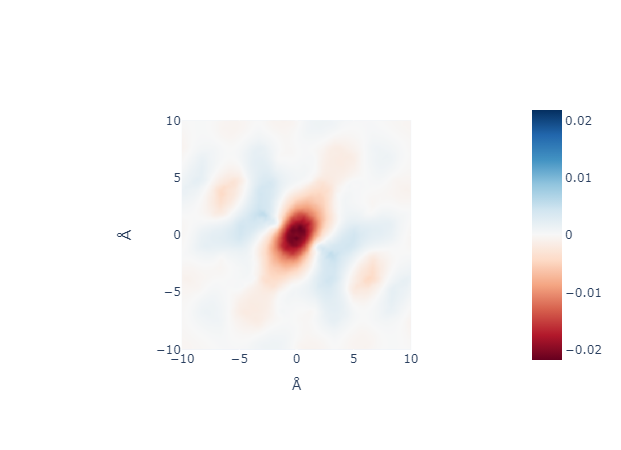

In [447]:
fig = go.Figure(data=inter.plot_hoppings(1, 6, 10, 400, 0.0001, 1)[0])
fig.update_layout(xaxis=dict(title='Å', constrain='domain'),
                      yaxis=dict(scaleanchor="x", title='Å',
                                 constrain='domain', scaleratio=1))


In [272]:
N = 10
a = 3.325

for i in range(-N, N):
    for j in range(N):
        x, y = a*i/N, a*j/N
        if not Interlayer(
            6.9, '/home/hidde/hidde/Unige/dft/WSe2_interlayer'
        ).allowed(x, y, ignore=True):
            continue
        else:
            print(i, j)
        data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data/interlayer'
        dict_1  = {}
        dict_2 = {}
        for hop in np.load(f'{data_dir}/wse2_x_{x:.2f}_y_{y:.2f}/tb_hopping.npy'):
            if hop[3] == 2 and hop[4] == 17:
                dict_1[(hop[0], hop[1])] = hop[5] + 1j* hop[6]
            if hop[3] == 17 and hop[4] == 2:
                dict_2[(hop[0], hop[1])] = hop[5] + 1j* hop[6]
        
        for key, value in dict_1.items():
            if value != np.conj(dict_2[(-key[0], -key[1])]):
                print(key)
                print(value, dict_2[(-key[0], -key[1])])

-4 7
-4 8
-3 6
-3 7
-3 8
-2 4
-2 5
-2 6
-2 7
-2 8
-1 2
-1 3
-1 4
-1 5
-1 6
-1 7
-1 8
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
1 0
1 1
1 2
1 3
1 4
1 5
1 6
1 7
1 8
2 0
2 1
2 2
2 3
2 4
2 5
2 6
2 7
2 8
3 0
3 1
3 2
3 3
3 4
3 5
3 6
3 7
3 8
4 0
4 1
4 2
4 3
4 4
4 5
4 6
4 7
4 8
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
6 0
6 1
6 2
6 3
6 4
6 5
6 6
7 0
7 1
7 2
7 3
7 4
7 5
8 0
8 1
8 2
8 3
9 0
9 1


In [255]:
0.078889+1e-06j

(0.078889+1e-06j)

In [58]:
inter.save_hoppings(10, 200, sigma=1)

In [74]:
N = 10
a = 3.325
inter = Interlayer(6.9, '/home/hidde/hidde/Unige/dft/WSe2_interlayer')

for i in range(-N, N):
    for j in range(N):
        print(i, j)
        #inter.run_dft(a*i/N, a*j/N, ignore=False, relax=True)
        #inter.extract_w90(a*i/N, a*j/N)

-10 0
-10 1
-10 2
-10 3
-10 4
-10 5
-10 6
-10 7
-10 8
-10 9
-9 0
-9 1
-9 2
-9 3
-9 4
-9 5
-9 6
-9 7
-9 8
-9 9
-8 0
-8 1
-8 2
-8 3
-8 4
-8 5
-8 6
-8 7
-8 8
-8 9
-7 0
-7 1
-7 2
-7 3
-7 4
-7 5
-7 6
-7 7
-7 8
-7 9
-6 0
-6 1
-6 2
-6 3
-6 4
-6 5
-6 6
-6 7
-6 8
-6 9
-5 0
-5 1
-5 2
-5 3
-5 4
-5 5
-5 6
-5 7
-5 8
-5 9
-4 0
-4 1
-4 2
-4 3
-4 4
-4 5
-4 6
-4 7
-4 8
-4 9
-3 0
-3 1
-3 2
-3 3
-3 4
-3 5
-3 6
-3 7
-3 8
-3 9
-2 0
-2 1
-2 2
-2 3
-2 4
-2 5
-2 6
-2 7
-2 8
-2 9
-1 0
-1 1
-1 2
-1 3
-1 4
-1 5
-1 6
-1 7
-1 8
-1 9
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
1 0
1 1
1 2
1 3
1 4
1 5
1 6
1 7
1 8
1 9
2 0
2 1
2 2
2 3
2 4
2 5
2 6
2 7
2 8
2 9
3 0
3 1
3 2
3 3
3 4
3 5
3 6
3 7
3 8
3 9
4 0
4 1
4 2
4 3
4 4
4 5
4 6
4 7
4 8
4 9
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
5 8
5 9
6 0
6 1
6 2
6 3
6 4
6 5
6 6
6 7
6 8
6 9
7 0
7 1
7 2
7 3
7 4
7 5
7 6
7 7
7 8
7 9
8 0
8 1
8 2
8 3
8 4
8 5
8 6
8 7
8 8
8 9
9 0
9 1
9 2
9 3
9 4
9 5
9 6
9 7
9 8
9 9


In [166]:
a = 3.325
a2 = a * np.sqrt(3)
a_vec = [a*np.array([1, 0]), 
         a*np.array([-1/2, np.sqrt(3)/2]), 
         np.zeros(2)]
data_dir = '/home/hidde/hidde/Unige/Hidde-Dijkstra.github.io/dft_data'
    
class WSe2_constants:
    a = 3.325
    a2 = a * np.sqrt(3)
    a_vec = [a*np.array([1, 0]), 
             a*np.array([-1/2, np.sqrt(3)/2]), 
             np.zeros(2)]

    permute = np.array([[0, 0, 1], 
                        [1, 0, 0], 
                        [0, 1, 0]])
    
    ε = -3.918069
    τ = -0.174011  
    H_0 = np.array([[ε, τ, τ], 
                    [τ, ε, τ], 
                    [τ, τ, ε]])
    λ = 0.115311
    H_soc = 1j*λ * np.array([[0, 1, -1],
                             [-1, 0, 1],
                             [1, -1, 0]])
    
    t_1 = 0.225295
    t_2 = 0.040698
    t_3 = 0.117744
    t_4 = -0.192186
    t_5 = -0.871690
    t_6 = 0.040386

    tt_1 = 0.088216
    tt_2 = -0.016560
    tt_3 = 0.010566
    tt_4 = -0.048007
    tt_5 = 0.052522

    ttt_1 = 0.024102
    ttt_2 = -0.004692
    ttt_3 = -0.030090
    ttt_4 = 0.020352
    ttt_5 = -0.007382
    ttt_6 = -0.018427
    
    H_t = np.array([[t_1, t_2, t_3],
                    [t_3, t_4, t_5], 
                    [t_2, t_6, t_4]])


    H_tt = np.array([[tt_1, tt_2, tt_3],
                     [tt_2, tt_1, tt_3], 
                     [tt_4, tt_4, tt_5]])

    H_ttt = np.array([[ttt_1, ttt_2, ttt_3],
                     [ttt_3, ttt_4, ttt_5], 
                     [ttt_2, ttt_6, ttt_4]])
    
    NN = [np.dot(a_vec, indeces) for indeces 
          in [(1, 0), (1, 1), (0, 1), (-1, 0), (-1, -1), (0, -1)]]
    θ_NN = [i*np.pi/3 for i in range(6)]
    NNN = [np.dot(a_vec, indeces) for indeces 
           in [(2, 1), (1, 2), (-1, 1), (-2, -1), (-1, -2), (1, -1)]]
    θ_NNN = [np.pi/6+i*np.pi/3 for i in range(6)]
    H_inter = [[RectBivariateSpline(np.load(f'{data_dir}/interlayer_wse2/R.npy'),
                                    np.load(f'{data_dir}/interlayer_wse2/R.npy'),
                                    np.load(f'{data_dir}/interlayer_wse2/H_{i}{j}.npy'))
               for i in range(3)] for j in range(3)]

In [205]:
def rot_mat(θ):
    return np.array([[np.cos(θ), -np.sin(θ)], 
                     [np.sin(θ), np.cos(θ)]])

class Hamiltonian(WSe2_constants):
    
    def __init__(self, n, m, Δn=1, R_max=6.6, V_1=0, V_2=0, δz=0.4):
        self.Δn = Δn
        self.R_max = R_max
        lattice_1 = Lattice(self.a)
        lattice_1.set_atom([0, 0], dict(name='W', key='1'))
        layer_1 = Supercell(lattice_1, n, m)                        
        lattice_2 = Lattice(self.a)
        lattice_2.set_atom([0, 0], dict(name='W', key='-1'))
        layer_2 = Supercell(lattice_2, m, n)
        self.lattice = Bilayer(layer_1, layer_2)
        self.θ = layer_1.θ
        self.V_1 = V_1
        self.V_2 = V_2
        self.δz = δz
        
    def V(self, r_1, r_2):
        V_1 = np.cos(2*np.pi*r_1) + np.cos(2*np.pi*r_2)+np.cos(2*np.pi*(r_1-r_2))
        V_2 = np.sin(2*np.pi*r_1) + np.sin(2*np.pi*r_2)+np.sin(2*np.pi*(r_1-r_2))
        return 2*self.V_1*V_1 - 2*self.V_2*V_2
    
    def Δz(self, r_1, r_2):
        return self.δz*(np.cos(2*np.pi*r_1) + np.cos(2*np.pi*r_2)+np.cos(2*np.pi*(r_1-r_2)))/4
        
    def prepare_H(self):
        self.H = np.zeros((self.Δn*2+1, self.Δn*2+1, 3*len(self.lattice), 3*len(self.lattice)))
        for (i, n_1), (j, n_2) in product(enumerate(range(-self.Δn, self.Δn+1)), 
                                          enumerate(range(-self.Δn, self.Δn+1))):
            for (k, atom_1), (l, atom_2) in product(enumerate(self.lattice),
                                                    enumerate(self.lattice)):
                self.H[i, j, 3*k:3*k+3, 3*l:3*l+3] = self.hop(atom_1, atom_2, n_1, n_2)
        self.H_σ = scipy.linalg.block_diag(*([self.H_soc]*len(self.lattice)))
        
    def H_mat(self, k, σ=1):
        return (sum([np.exp(2*np.pi*1j*(k[0]*n_1+k[1]*n_2))*self.H[i, j]
                 for j, n_2 in enumerate(range(-self.Δn, self.Δn+1))
                 for i, n_1 in enumerate(range(-self.Δn, self.Δn+1))])
                + σ*self.H_σ)
        
    def hop(self, atom_1, atom_2, n_1, n_2, tol=10e-5):
        R = (np.dot([n_1, n_2], self.lattice.a_vec) 
            + self.lattice.a*(atom_1.position - atom_2.position))
        r_1, r_2 = [np.dot(self.lattice.a*atom_1.position, b) for b in self.lattice.b_vec]
        if atom_1.key == atom_2.key:
            return self.intralayer(R[:2], int(atom_1.key), r_1, r_2)        
        elif np.linalg.norm(R[:2]) < self.R_max:
            #return np.zeros((3, 3))
            return np.array([[H_(*(rot_mat(self.θ)@R[:2]))[0][0] 
                              for H_ in H_row] 
                             for H_row in self.H_inter]) * np.exp(-self.Δz(r_1, r_2)/np.sqrt(6))
        else:
            return np.zeros((3, 3))
    
    def φ(self, R, layer):
        return np.angle(np.dot(rot_mat(-layer*self.θ)@R, [1, 1j]))
    
    def Δφ(self, θ, φ):
        return np.abs((φ-θ+np.pi) % (2*np.pi) - np.pi)
                
    def intralayer(self, R, layer, r_1, r_2, tol=10e-2):
        ΔR2 = np.dot(R, R)
        if ΔR2 < tol:
            return self.H_0 + np.eye(3)*self.V(r_1, r_2)
        elif self.a**2-tol < ΔR2 < self.a**2+tol:
            φ = self.φ(R, layer)
            for i, θ in enumerate(self.θ_NN):
                if self.Δφ(θ, φ) < tol:
                    return self.rot_hop_mat(self.H_t, i)
            print('NN not found')
        elif self.a2**2-tol < ΔR2 < self.a2**2+tol:
            φ = self.φ(R, layer)
            for i, θ in enumerate(self.θ_NNN):
                if self.Δφ(θ, φ) < tol:
                    return self.rot_hop_mat(self.H_tt, i)
            print('NNN not found')
        elif 4*self.a**2-tol < ΔR2 < 4*self.a**2+tol:
            φ = self.φ(R, layer)
            for i, θ in enumerate(self.θ_NN):
                if self.Δφ(θ, φ) < tol:
                    return self.rot_hop_mat(self.H_ttt, i)
            print('NNN not found')
        return np.zeros((3, 3))
                            
    def rot_hop_mat(self, H, i):
        if i == 0:
            return H
        elif i == 1:
            return np.transpose(self.permute @ H @ self.permute.T)
        elif i == 2:
            return self.permute.T @ H @ self.permute
        elif i == 3:
            return np.transpose(H)
        elif i == 4:
            return self.permute @ H @ self.permute.T
        elif i == 5:
            return np.transpose(self.permute.T @ H @ self.permute)

In [206]:
n = 7
m = 6

H = Hamiltonian(n, m, Δn=1, R_max=6.5, V_1=0.008, V_2=0.0)
print(180-2*H.θ*180/np.pi)
H.prepare_H()

354.9141521918765


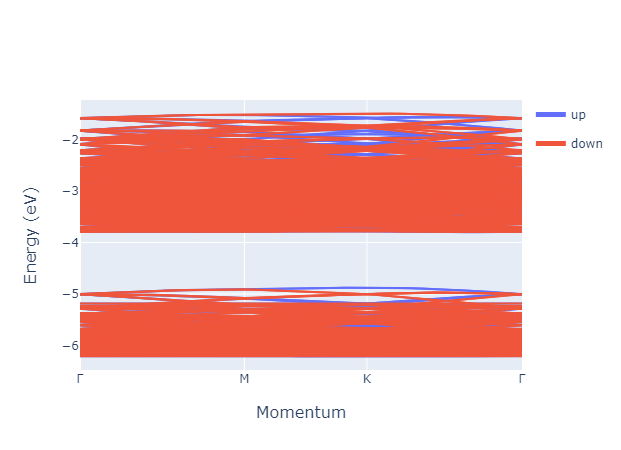

In [207]:
from moire.bandstructure import BandStructure
from functools import partial
bandstructure = BandStructure()
bandstructure.set_k_path([(0, 0), (0.5, 0), (1/3, 1/3), (0, 0)],
                         ['Γ', 'M', 'K', 'Γ'], 40)
bandstructure.plot_from_H(H=partial(H.H_mat, σ=-1), name='up', color='red')
bandstructure.plot_from_H(H=partial(H.H_mat, σ=1), name='down', color='red') 
bandstructure.fig

In [13]:
H.lattice.a/3.3

13.09848484848485

In [61]:
#H.prepare_H()
pd.DataFrame(H.H_mat(np.array([0, 0])) - np.conjugate(H.H_mat(np.array([0, 0]))).T)

,0,1,2,3,4,5,6,7,8,9,...,104,105,106,107,108,109,110,111,112,113
0,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
1,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
2,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
3,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
4,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
110,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
111,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j
112,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,...,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j,0.0+0.0j


In [28]:
for i in  range(8):
    print(H.H_mat(np.array([0, 0]))[3*i:3*i+3, 3*i:3*i+3])

[[-3.78498451+0.j       -0.227244  +0.115311j -0.227244  -0.115311j]
 [-0.227244  -0.115311j -3.78498451+0.j       -0.227244  +0.115311j]
 [-0.227244  +0.115311j -0.227244  -0.115311j -3.78498451+0.j      ]]
[[-3.77754622+0.j       -0.227244  +0.115311j -0.227244  -0.115311j]
 [-0.227244  -0.115311j -3.77754622+0.j       -0.227244  +0.115311j]
 [-0.227244  +0.115311j -0.227244  -0.115311j -3.77754622+0.j      ]]
[[-3.774484+0.j       -0.227244+0.115311j -0.227244-0.115311j]
 [-0.227244-0.115311j -3.774484+0.j       -0.227244+0.115311j]
 [-0.227244+0.115311j -0.227244-0.115311j -3.774484+0.j      ]]
[[-3.78398269+0.j       -0.227244  +0.115311j -0.227244  -0.115311j]
 [-0.227244  -0.115311j -3.78398269+0.j       -0.227244  +0.115311j]
 [-0.227244  +0.115311j -0.227244  -0.115311j -3.78398269+0.j      ]]
[[-3.77898605+0.j       -0.227244  +0.115311j -0.227244  -0.115311j]
 [-0.227244  -0.115311j -3.77898605+0.j       -0.227244  +0.115311j]
 [-0.227244  +0.115311j -0.227244  -0.115311j -3

In [71]:
eig = np.linalg.eigh(H.H_mat(np.array([1/3, 1/3]), σ=-1))[0]

In [74]:
pd.DataFrame(eig[900:950].T)

,0
0,-5.114330
1,-5.112917
2,-5.112166
3,-5.110528
4,-5.109524
5,-5.108951
6,-5.100707
7,-5.100236
8,-5.099180
9,-5.099026


In [65]:
H.H_mat(np.array([0, 0])).shape

(1986, 1986)

In [40]:
a = 1
c = a + 1
b = [(a, i) for i in range(3)]

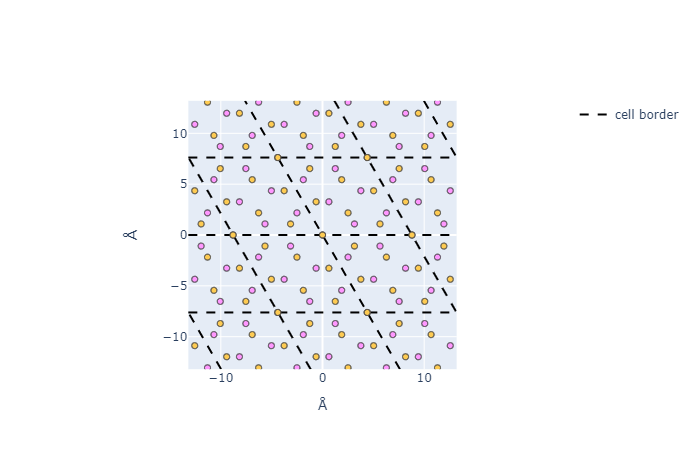

In [150]:
H.lattice.plot(3)

In [23]:
for (a, b), (c, d) in product(enumerate(range(2)), enumerate(range(2))):
    print(a, b, c, d)

0 0 0 0
0 0 1 1
1 1 0 0
1 1 1 1


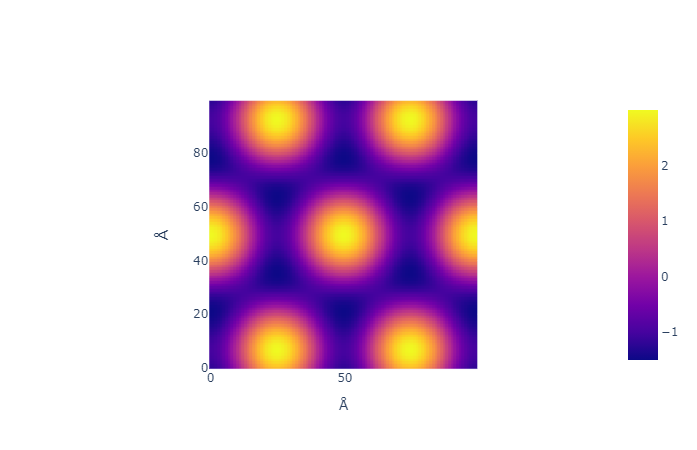

In [13]:
def V(x, y):
    n_1 = x + y/np.sqrt(3)
    n_2 = 2/np.sqrt(3) * y
    V_1 = np.cos(2*np.pi*n_1) + np.cos(2*np.pi*n_2)+np.cos(2*np.pi*(n_1-n_2))
    V_2 = np.sin(2*np.pi*n_1) + np.sin(2*np.pi*n_2)+np.sin(2*np.pi*(n_1-n_2))
    #V_2 = np.sin(2*np.pi*(2*n_1-n_2)) + np.sin(2*np.pi*(n_1+n_2)) + np.sin(2*np.pi*(2*n_2-n_1))
    return 1*V_1 - 0*V_2
    
x, y = np.meshgrid(np.linspace(-1, 1, 100), np.linspace(-1, 1, 100))
x.shape
fig = go.Figure(data=go.Heatmap(z=V(x, y)))
fig.update_layout(xaxis=dict(title='Å', constrain='domain'),
                  yaxis=dict(scaleanchor="x", title='Å',
                             constrain='domain', scaleratio=1))
fig

In [138]:
V(0, 0)

3.0

In [141]:
V(*np.meshgrid(np.linspace(-1.5, 1.5, 100),
                                          np.linspace(-1.5, 1.5, 100)))

ValueError: shapes (2,100,100) and (2,) not aligned: 100 (dim 2) != 2 (dim 0)

In [143]:
a, b = np.meshgrid(np.linspace(-1.5, 1.5, 100),
                                          np.linspace(-1.5, 1.5, 100))
a.shape

(100, 100)

In [146]:
V(x, y)

ValueError: shapes (2,100,100) and (2,) not aligned: 100 (dim 2) != 2 (dim 0)

In [148]:
y.shape

(100, 100)

In [165]:
def transform(string, prefix):
    i = 1
    my_str = ''
    hops = []
    for hop in [[elem.strip() for elem in line.strip().split('  ') if elem!=''][5]
                for line in string.strip().split('\n')]:
        if hop not in hops:
            hops.append(hop)
            my_str += f'    {prefix}_{i} = {hop}\n'
            i += 1
    return my_str
    
t = """1    0    0    1    1    0.225295   -0.000000
    1    0    0    2    1    0.040698    0.000000
    1    0    0    3    1    0.117744    0.000000
    1    0    0    1    2    0.117744   -0.000000
    1    0    0    2    2   -0.192186    0.000000
    1    0    0    3    2   -0.871690    0.000000
    1    0    0    1    3    0.040698    0.000000
    1    0    0    2    3    0.040386   -0.000000
    1    0    0    3    3   -0.192186   -0.000000"""

tt = """     2    1    0    1    1    0.088216    0.000000
    2    1    0    2    1   -0.016560   -0.000000
    2    1    0    3    1    0.010566   -0.000000
    2    1    0    1    2   -0.016560   -0.000000
    2    1    0    2    2    0.088216   -0.000000
    2    1    0    3    2    0.010566    0.000000
    2    1    0    1    3   -0.048007    0.000000
    2    1    0    2    3   -0.048007    0.000000
    2    1    0    3    3    0.052522    0.000000
"""

ttt = """ 2    0    0    1    1    0.024102    0.000000
    2    0    0    2    1   -0.004692    0.000000
    2    0    0    3    1   -0.030090   -0.000000
    2    0    0    1    2   -0.030090    0.000000
    2    0    0    2    2    0.020352   -0.000000
    2    0    0    3    2   -0.007382   -0.000000
    2    0    0    1    3   -0.004692   -0.000000
    2    0    0    2    3   -0.018427   -0.000000
    2    0    0    3    3    0.020353   -0.000000
"""
print(transform(t, 't'))
print(transform(tt, 'tt'))
print(transform(ttt, 'ttt'))

    t_1 = 0.225295
    t_2 = 0.040698
    t_3 = 0.117744
    t_4 = -0.192186
    t_5 = -0.871690
    t_6 = 0.040386

    tt_1 = 0.088216
    tt_2 = -0.016560
    tt_3 = 0.010566
    tt_4 = -0.048007
    tt_5 = 0.052522

    ttt_1 = 0.024102
    ttt_2 = -0.004692
    ttt_3 = -0.030090
    ttt_4 = 0.020352
    ttt_5 = -0.007382
    ttt_6 = -0.018427
    ttt_7 = 0.020353



In [ ]:
==== e(  14) =   -10.10544 eV ==== 
     psi = 0.150*[#   7]+0.145*[#   6]+0.094*[#  20]+0.093*[#  27]+0.093*[#  28]
          +0.084*[#  40]+0.081*[#  17]+0.078*[#  36]+0.073*[#  21]+0.067*[#  16]
          +0.059*[#  15]+0.055*[#  38]+0.053*[#  41]+0.049*[#  37]+0.046*[#  19]
          +0.041*[#  42]

In [18]:
class PowTwo:
    
    sub = None

    def __init__(self, max=0):
        self.max = max
        
    def add_sub(self, sub):
        self.sub = sub
        self.sub_iter = iter(sub)

    def __iter__(self):
        self.n = 0
        return self

    def __next__(self):
        if self.n <= self.max:
            if self.sub is not None:
                try: 
                    result = next(self.sub_iter)
                except StopIteration:
                    self.n += 1
                    self.sub_iter = iter(self.sub)
                    result = next(self.sub_iter)
                return result + self.n
            else:
                result = 2 ** self.n
                self.n += 1
                return result
        else:
            raise StopIteration


# create an object
numbers = PowTwo(3)
numbers.add_sub(PowTwo(4))
for i in numbers:
    print(i)


1
2
4
8
16
2
3
5
9
17
3
4
6
10
18
4
5
7
11
19
5


In [42]:
def update(dict_1: dict, dict_2: dict) -> dict:
    for key, value in dict_2.items():
        if isinstance(value, dict):
            dict_1[key] = update(dict_2.get(key, {}), value)
        else:
            dict_1[key] = value
    return dict_1

def update_obj(obj: any, dictionary: dict) -> None:
    for key, value in dictionary.items():
        if isinstance(value, dict):
            update(getattr(obj, key), value)
        else:
            setattr(obj, key, value)

In [43]:
class test:
    
    a = 3
    b = dict(b=dict(c=3))
  
a = test()
update_obj(a, dict(b=dict(b=dict(c=2))))

In [45]:
a

In [57]:
def f(a=2):
    print(a)
    
f(**{}, a=2)

2


In [53]:
print(*{'b': 2})

b


In [69]:
from dataclasses import dataclass
from itertools import cycle

@dataclass
class test:
    color = cycle(['rood', 'blauw'])
    
a = test()

In [70]:
a.color[0]

TypeError: 'itertools.cycle' object is not subscriptable

In [73]:
class test:
    
    def __len__(self):
        return 1
    
    def __iter__(self):
        return iter([i for i in range(3)])
    
    
for i in test():
    print(i)

0
1
2


In [3]:
from pydantic import BaseModel
from abc import ABC, abstractmethod

class User(BaseModel):
    id: int
    name = 'Jane Doe'
    
    @abstractmethod
    def poef(self):
        """hoi"""
    
class test(User):
    top: str
        
    def poef(self):
        print('poef')
        
        
a = test(id = 2, top='a')

In [11]:
a

<test id=2 name='Jane Doe' top='a'>

In [1]:
import abc
from pydantic import BaseModel


class FooBarModel(BaseModel, abc.ABC):
    a: str
    b: int

    @abc.abstractmethod
    def my_abstract_method(self):
        pass

In [10]:
from typing import Optional

class A(BaseModel):
    
    a: Optional[A]

In [11]:
a = A()

In [12]:
print(a.a is None)

True


In [13]:
a.bn = 3

ValueError: "A" object has no field "bn"

In [14]:
class A:
    b=3
    
a = A()
a.c = 2

In [15]:
a.c\

2

In [5]:
def figure(func):
    def wrapper(*args, **kwargs):
        print(args)
        for kwarg in kwargs:
            print(kwarg)
        return func(*args, **kwargs)

    return wrapper

In [8]:
@figure
def f(a, b, c=3, d=4):
    pass

f(2, 3, c=3, d=2)

(2, 3)
c
d


In [18]:
class A:
    
    @figure
    def my_f(self, a):
        print(a)
        
        
a = A()
a.my_f(3)

(<__main__.A object at 0x7f9d85036590>, 3)
3


In [19]:
from functools import partial

g = partial(f, 2, 3, c=2)

In [21]:
g(d=2)

(2, 3)
c
d


In [22]:
def f(lst):
    return lst or [1]

In [25]:
f([2, 3])

[2, 3]

In [26]:
{"": 0}

{'': 0}

In [1]:
from moire.plotting.base import figure

ModuleNotFoundError: No module named 'moire.plotting'

In [1]:
import moire

In [2]:
dir(moire)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'lattice',
 'moire']